# 08 Single-Cell DP-Like Trafficking/Residency Marker Dynamics

Inspect whether cells show increased `Ccr7/S1pr1/Klf2` while retaining high `Cd69/Itgae/Ccr9/Cxcr6` in the Kallies single-cell dataset. This mirrors notebook 07's bulk DP analysis, but uses the annotated single-cell object and summarizes by condition and cluster.


In [1]:
import os
os.environ.setdefault("MPLCONFIGDIR", "/tmp/matplotlib")

import sys
sys.path.append("/home/dk5299/Projects_31926/RNA-seq/Kallies_Sci_Immuno_2025")

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc

from src.paths import INTERMEDIATE_DIR, RESULTS_DIR

sc.settings.verbosity = 2
sc.settings.set_figure_params(dpi=110, facecolor="white")


/tmp/matplotlib is not a writable directory


Matplotlib created a temporary cache directory at /tmp/matplotlib-rpzz2hlm because there was an issue with the default path (/tmp/matplotlib); it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


/tmp/ipykernel_4194202/4025574917.py:15: FutureWarning: Use `scanpy.set_figure_params` instead
  sc.settings.set_figure_params(dpi=110, facecolor="white")


## Inputs and Marker Sets


In [2]:
input_file = INTERMEDIATE_DIR / "04_cell_annotation.h5ad"
output_dir = RESULTS_DIR / "08_sc_dp_like_marker_dynamics"
output_dir.mkdir(parents=True, exist_ok=True)

marker_sets = {
    "egress_up": ["Ccr7", "S1pr1", "Klf2"],
    "residency_gut_high": ["Cd69", "Itgae", "Ccr9", "Cxcr6"],
    "combined_dp_like_state": ["Ccr7", "S1pr1", "Klf2", "Cd69", "Itgae", "Ccr9", "Cxcr6"],
}

marker_genes = list(dict.fromkeys(gene for genes in marker_sets.values() for gene in genes))
marker_genes


['Ccr7', 'S1pr1', 'Klf2', 'Cd69', 'Itgae', 'Ccr9', 'Cxcr6']

## Load and Normalize from Counts

The annotated object stores raw counts in `layers["counts"]`. Expression summaries and scores below use log-normalized counts, not scaled PCA input.


In [3]:
adata = sc.read_h5ad(input_file)

adata.obs["condition"] = adata.obs["sample_group"].map(
    {
        "sIEL": "IEL_memory",
        "sLPL": "LPL_memory",
        "rechallenge": "rechallenge",
    }
)
condition_order = ["IEL_memory", "LPL_memory", "rechallenge"]
adata.obs["condition"] = pd.Categorical(adata.obs["condition"], categories=condition_order, ordered=True)

expr_adata = adata.copy()
expr_adata.X = expr_adata.layers["counts"].copy()
expr_adata.uns.pop("log1p", None)
sc.pp.normalize_total(expr_adata, target_sum=1e4)
sc.pp.log1p(expr_adata)

present_markers = [gene for gene in marker_genes if gene in expr_adata.var_names]
missing_markers = sorted(set(marker_genes).difference(present_markers))
print("Present:", present_markers)
print("Missing:", missing_markers)
expr_adata


normalizing counts per cell


/home/dk5299/Projects_31926/RNA-seq/Kallies_Sci_Immuno_2025/.venv/lib/python3.12/site-packages/numba/np/ufunc/parallel.py:373: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)


    finished (0:00:02)


Present: ['Ccr7', 'S1pr1', 'Klf2', 'Cd69', 'Itgae', 'Ccr9', 'Cxcr6']
Missing: []


AnnData object with n_obs × n_vars = 13206 × 16263
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'hash_id', 'hto_max', 'hto_second', 'hto_top_to_second_ratio', 'hto_total', 'sample_group', 'man_2025_group', 'demux_call', 'hto_HT1', 'hto_HT2', 'hto_HT3', 'leiden_0_5', 'cell_type_manual', 'cd8_subset', 'condition'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'cell_type_manual_colors', 'hash_id_colors', 'hvg', 'leiden_0_5', 'leiden_0_5_colors', 'neighbors', 'pca', 'rank_genes_gr

## Per-Gene Expression Summary


In [4]:
expr_df = sc.get.obs_df(expr_adata, keys=present_markers, use_raw=False)
expr_df["condition"] = expr_adata.obs["condition"].values
expr_df["sample_group"] = expr_adata.obs["sample_group"].values
expr_df["leiden_0_5"] = expr_adata.obs["leiden_0_5"].values

expr_long = expr_df.melt(
    id_vars=["condition", "sample_group", "leiden_0_5"],
    value_vars=present_markers,
    var_name="gene",
    value_name="log1p_norm_expr",
)
expr_long["detected"] = expr_long["log1p_norm_expr"].gt(0)

condition_summary = (
    expr_long.groupby(["gene", "condition"], observed=True)
    .agg(
        mean_log1p=("log1p_norm_expr", "mean"),
        median_log1p=("log1p_norm_expr", "median"),
        pct_detected=("detected", "mean"),
        n_cells=("log1p_norm_expr", "size"),
    )
    .reset_index()
)
condition_summary["pct_detected"] *= 100

cluster_condition_summary = (
    expr_long.groupby(["gene", "condition", "leiden_0_5"], observed=True)
    .agg(
        mean_log1p=("log1p_norm_expr", "mean"),
        pct_detected=("detected", "mean"),
        n_cells=("log1p_norm_expr", "size"),
    )
    .reset_index()
)
cluster_condition_summary["pct_detected"] *= 100

expr_file = output_dir / "08_sc_marker_expression_by_cell.tsv"
condition_summary_file = output_dir / "08_sc_marker_expression_by_condition.tsv"
cluster_summary_file = output_dir / "08_sc_marker_expression_by_condition_cluster.tsv"
expr_long.to_csv(expr_file, sep="	", index=False)
condition_summary.to_csv(condition_summary_file, sep="	", index=False)
cluster_condition_summary.to_csv(cluster_summary_file, sep="	", index=False)

print("Saved:", expr_file)
print("Saved:", condition_summary_file)
print("Saved:", cluster_summary_file)
condition_summary


Saved: /mnt/sata4/Dhruv_2025/Projects_31926/RNA_Seq/Kallies_Sci_Immuno_2025/results/08_sc_dp_like_marker_dynamics/08_sc_marker_expression_by_cell.tsv
Saved: /mnt/sata4/Dhruv_2025/Projects_31926/RNA_Seq/Kallies_Sci_Immuno_2025/results/08_sc_dp_like_marker_dynamics/08_sc_marker_expression_by_condition.tsv
Saved: /mnt/sata4/Dhruv_2025/Projects_31926/RNA_Seq/Kallies_Sci_Immuno_2025/results/08_sc_dp_like_marker_dynamics/08_sc_marker_expression_by_condition_cluster.tsv


,gene,condition,mean_log1p,median_log1p,pct_detected,n_cells
0,Ccr7,IEL_memory,0.019397,0.000000,1.851483,5023
1,Ccr7,LPL_memory,0.016153,0.000000,1.882796,4249
2,Ccr7,rechallenge,0.040783,0.000000,3.177428,3934
3,Ccr9,IEL_memory,1.147429,1.196627,66.832570,5023
4,Ccr9,LPL_memory,0.924426,0.878490,55.777830,4249
5,Ccr9,rechallenge,0.741657,0.000000,44.890696,3934
6,Cd69,IEL_memory,1.825729,1.968003,85.068684,5023
7,Cd69,LPL_memory,1.597911,1.713103,82.631207,4249
8,Cd69,rechallenge,1.984968,2.179642,84.926284,3934
9,Cxcr6,IEL_memory,1.338979,1.477513,80.171212,5023


## Score Marker Sets

Scores are simple mean gene-wise z-scores across cells. This is easier to interpret for a custom biological state than Scanpy's control-gene-adjusted score.


In [5]:
gene_expr = expr_df[present_markers]
gene_z = (gene_expr - gene_expr.mean(axis=0)) / gene_expr.std(axis=0).replace(0, np.nan)

score_columns = []
for module, genes in marker_sets.items():
    present = [gene for gene in genes if gene in gene_z.columns]
    score_col = f"score_{module}"
    expr_adata.obs[score_col] = gene_z[present].mean(axis=1)
    score_columns.append(score_col)

score_df = expr_adata.obs[["condition", "sample_group", "leiden_0_5"] + score_columns].copy()
score_summary = (
    score_df.groupby("condition", observed=True)[score_columns]
    .agg(["mean", "median", "std"])
    .reset_index()
)
score_summary.columns = ["_".join(str(x) for x in col if x) if isinstance(col, tuple) else col for col in score_summary.columns]
score_summary["n_cells"] = score_summary["condition"].map(score_df["condition"].value_counts())

cluster_score_summary = (
    score_df.groupby(["condition", "leiden_0_5"], observed=True)[score_columns]
    .agg(["mean", "median", "std"])
    .reset_index()
)
cluster_score_summary.columns = ["_".join(str(x) for x in col if x) if isinstance(col, tuple) else col for col in cluster_score_summary.columns]
cluster_score_summary["n_cells"] = cluster_score_summary.apply(
    lambda row: ((score_df["condition"].astype(str) == str(row["condition"])) & (score_df["leiden_0_5"].astype(str) == str(row["leiden_0_5"]))).sum(),
    axis=1,
)

score_file = output_dir / "08_sc_dp_like_scores_by_cell.tsv"
score_summary_file = output_dir / "08_sc_dp_like_scores_by_condition.tsv"
cluster_score_file = output_dir / "08_sc_dp_like_scores_by_condition_cluster.tsv"
score_df.to_csv(score_file, sep="	", index=True, index_label="barcode")
score_summary.to_csv(score_summary_file, sep="	", index=False)
cluster_score_summary.to_csv(cluster_score_file, sep="	", index=False)

print("Saved:", score_file)
print("Saved:", score_summary_file)
print("Saved:", cluster_score_file)
score_summary


Saved: /mnt/sata4/Dhruv_2025/Projects_31926/RNA_Seq/Kallies_Sci_Immuno_2025/results/08_sc_dp_like_marker_dynamics/08_sc_dp_like_scores_by_cell.tsv
Saved: /mnt/sata4/Dhruv_2025/Projects_31926/RNA_Seq/Kallies_Sci_Immuno_2025/results/08_sc_dp_like_marker_dynamics/08_sc_dp_like_scores_by_condition.tsv
Saved: /mnt/sata4/Dhruv_2025/Projects_31926/RNA_Seq/Kallies_Sci_Immuno_2025/results/08_sc_dp_like_marker_dynamics/08_sc_dp_like_scores_by_condition_cluster.tsv


,condition,score_egress_up_mean,score_egress_up_median,score_egress_up_std,score_residency_gut_high_mean,score_residency_gut_high_median,score_residency_gut_high_std,score_combined_dp_like_state_mean,score_combined_dp_like_state_median,score_combined_dp_like_state_std,n_cells
0,IEL_memory,-0.085716,-0.341286,0.564408,0.110698,0.142045,0.535793,0.026520,0.030038,0.358246,5023
1,LPL_memory,0.016258,-0.341286,0.698348,0.024888,0.031108,0.553131,0.021190,0.015215,0.365122,4249
2,rechallenge,0.091883,-0.341286,0.701270,-0.168222,-0.181908,0.543018,-0.056748,-0.069246,0.406415,3934


## Plot Genes on UMAP


Saved: /mnt/sata4/Dhruv_2025/Projects_31926/RNA_Seq/Kallies_Sci_Immuno_2025/results/08_sc_dp_like_marker_dynamics/08_sc_marker_expression_umap.png


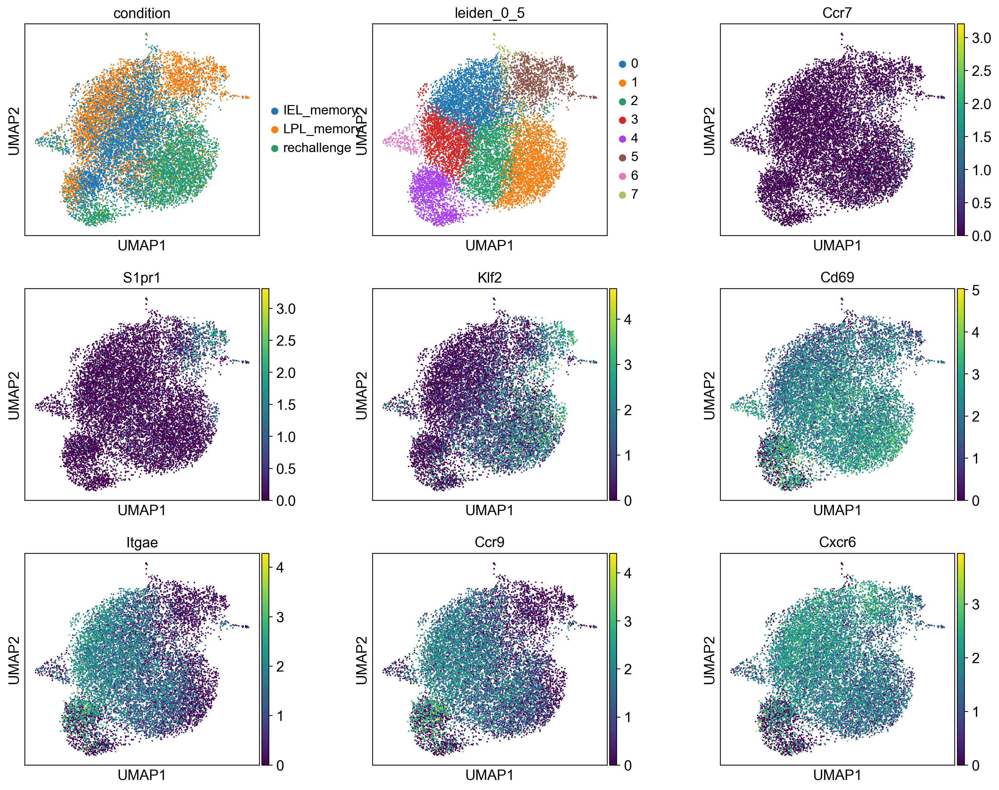

In [6]:
sc.pl.umap(
    expr_adata,
    color=["condition", "leiden_0_5"] + present_markers,
    use_raw=False,
    ncols=3,
    wspace=0.35,
    show=False,
)
fig = plt.gcf()
umap_gene_file = output_dir / "08_sc_marker_expression_umap.png"
fig.savefig(umap_gene_file, bbox_inches="tight")
print("Saved:", umap_gene_file)


## Dotplots by Condition and Cluster


Saved: /mnt/sata4/Dhruv_2025/Projects_31926/RNA_Seq/Kallies_Sci_Immuno_2025/results/08_sc_dp_like_marker_dynamics/08_sc_marker_dotplot_by_condition.png
Saved: /mnt/sata4/Dhruv_2025/Projects_31926/RNA_Seq/Kallies_Sci_Immuno_2025/results/08_sc_dp_like_marker_dynamics/08_sc_marker_dotplot_by_cluster.png


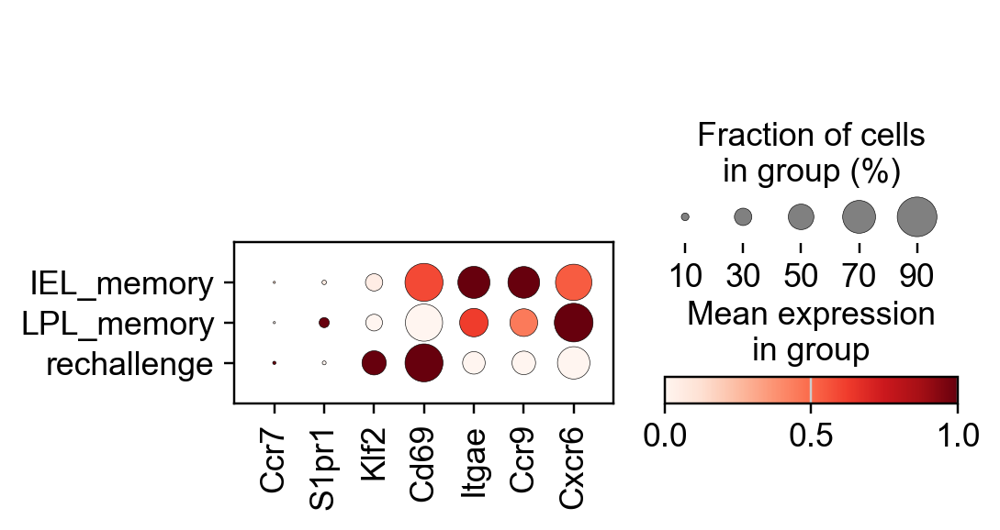

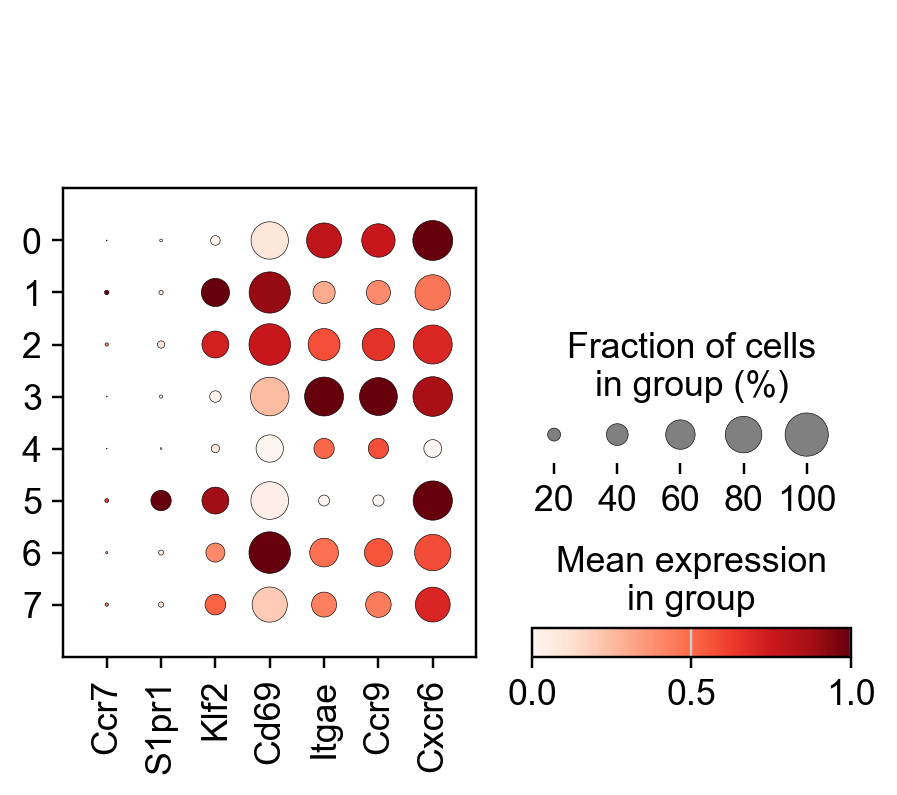

In [7]:
sc.pl.dotplot(
    expr_adata,
    var_names=present_markers,
    groupby="condition",
    use_raw=False,
    standard_scale="var",
    show=False,
)
fig = plt.gcf()
dot_condition_file = output_dir / "08_sc_marker_dotplot_by_condition.png"
fig.savefig(dot_condition_file, bbox_inches="tight")
print("Saved:", dot_condition_file)

sc.pl.dotplot(
    expr_adata,
    var_names=present_markers,
    groupby="leiden_0_5",
    use_raw=False,
    standard_scale="var",
    show=False,
)
fig = plt.gcf()
dot_cluster_file = output_dir / "08_sc_marker_dotplot_by_cluster.png"
fig.savefig(dot_cluster_file, bbox_inches="tight")
print("Saved:", dot_cluster_file)


## Condition-Level Gene Dynamics


Saved: /mnt/sata4/Dhruv_2025/Projects_31926/RNA_Seq/Kallies_Sci_Immuno_2025/results/08_sc_dp_like_marker_dynamics/08_sc_marker_expression_by_condition.png


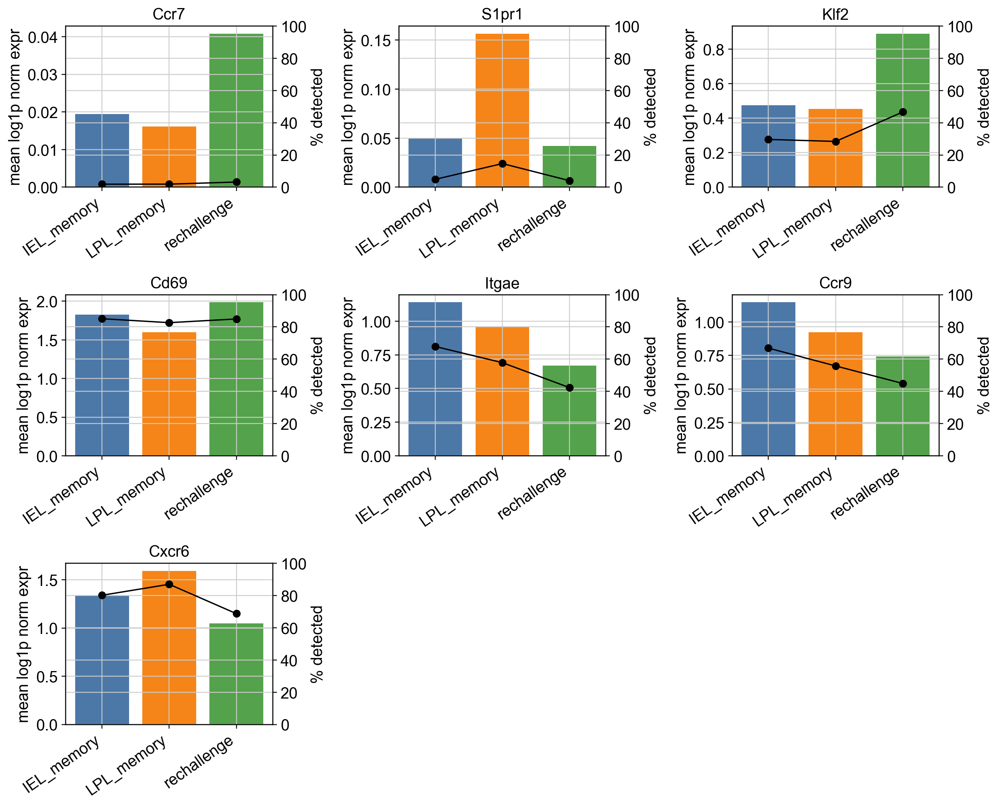

In [8]:
plot_df = condition_summary.copy()

n_genes = len(present_markers)
ncols = 3
nrows = int(np.ceil(n_genes / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(4.2 * ncols, 3.4 * nrows), squeeze=False)

for ax, gene in zip(axes.ravel(), present_markers):
    gene_df = plot_df[plot_df["gene"].eq(gene)].set_index("condition").reindex(condition_order)
    x = np.arange(len(condition_order))
    ax.bar(x, gene_df["mean_log1p"], color=["#4c78a8", "#f58518", "#54a24b"])
    ax2 = ax.twinx()
    ax2.plot(x, gene_df["pct_detected"], color="black", marker="o", linewidth=1.2)
    ax.set_title(gene)
    ax.set_xticks(x)
    ax.set_xticklabels(condition_order, rotation=35, ha="right")
    ax.set_ylabel("mean log1p norm expr")
    ax2.set_ylabel("% detected")
    ax2.set_ylim(0, 100)

for ax in axes.ravel()[n_genes:]:
    ax.axis("off")

fig.tight_layout()
condition_gene_file = output_dir / "08_sc_marker_expression_by_condition.png"
fig.savefig(condition_gene_file, bbox_inches="tight")
print("Saved:", condition_gene_file)


## Module Score Dynamics


/tmp/ipykernel_4194202/2668510887.py:12: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(values, labels=condition_order, showfliers=False)
/tmp/ipykernel_4194202/2668510887.py:12: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(values, labels=condition_order, showfliers=False)
/tmp/ipykernel_4194202/2668510887.py:12: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(values, labels=condition_order, showfliers=False)


Saved: /mnt/sata4/Dhruv_2025/Projects_31926/RNA_Seq/Kallies_Sci_Immuno_2025/results/08_sc_dp_like_marker_dynamics/08_sc_dp_like_module_scores_by_condition.png


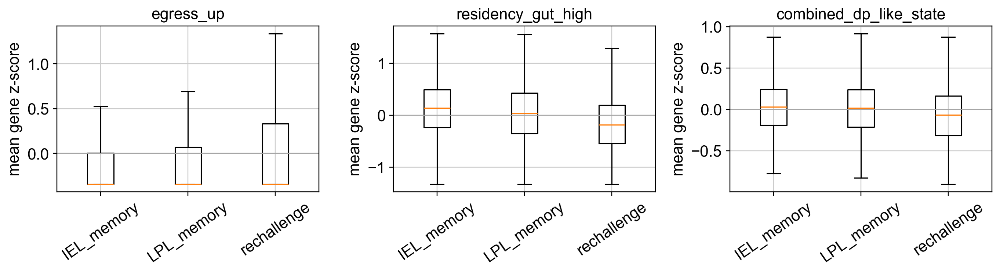

In [9]:
module_names = [col.replace("score_", "") for col in score_columns]
plot_score = score_df.copy()

n_modules = len(score_columns)
fig, axes = plt.subplots(1, n_modules, figsize=(4.2 * n_modules, 3.6), squeeze=False)

for ax, score_col, module_name in zip(axes.ravel(), score_columns, module_names):
    values = [
        plot_score.loc[plot_score["condition"].astype(str).eq(condition), score_col].values
        for condition in condition_order
    ]
    ax.boxplot(values, labels=condition_order, showfliers=False)
    ax.axhline(0, color="0.65", linewidth=0.8)
    ax.set_title(module_name)
    ax.set_ylabel("mean gene z-score")
    ax.tick_params(axis="x", rotation=35)

fig.tight_layout()
score_plot_file = output_dir / "08_sc_dp_like_module_scores_by_condition.png"
fig.savefig(score_plot_file, bbox_inches="tight")
print("Saved:", score_plot_file)


## Find Cells with Both Programs High

This labels cells that are above the condition-agnostic median for both the `egress_up` and `residency_gut_high` scores.


In [10]:
egress_col = "score_egress_up"
residency_col = "score_residency_gut_high"

score_df["egress_high"] = score_df[egress_col] > score_df[egress_col].median()
score_df["residency_gut_high"] = score_df[residency_col] > score_df[residency_col].median()
score_df["double_program_high"] = score_df["egress_high"] & score_df["residency_gut_high"]
expr_adata.obs["double_program_high"] = score_df["double_program_high"].map({True: "high_both", False: "other"}).values

state_summary = (
    score_df.groupby("condition", observed=True)["double_program_high"]
    .agg(n_high_both="sum", n_cells="size")
    .reset_index()
)
state_summary["pct_high_both"] = state_summary["n_high_both"] / state_summary["n_cells"] * 100

state_cluster_summary = (
    score_df.groupby(["condition", "leiden_0_5"], observed=True)["double_program_high"]
    .agg(n_high_both="sum", n_cells="size")
    .reset_index()
)
state_cluster_summary["pct_high_both"] = state_cluster_summary["n_high_both"] / state_cluster_summary["n_cells"] * 100

state_file = output_dir / "08_sc_double_program_high_by_condition.tsv"
state_cluster_file = output_dir / "08_sc_double_program_high_by_condition_cluster.tsv"
state_summary.to_csv(state_file, sep="	", index=False)
state_cluster_summary.to_csv(state_cluster_file, sep="	", index=False)

print("Saved:", state_file)
print("Saved:", state_cluster_file)
state_summary


Saved: /mnt/sata4/Dhruv_2025/Projects_31926/RNA_Seq/Kallies_Sci_Immuno_2025/results/08_sc_dp_like_marker_dynamics/08_sc_double_program_high_by_condition.tsv
Saved: /mnt/sata4/Dhruv_2025/Projects_31926/RNA_Seq/Kallies_Sci_Immuno_2025/results/08_sc_dp_like_marker_dynamics/08_sc_double_program_high_by_condition_cluster.tsv


,condition,n_high_both,n_cells,pct_high_both
0,IEL_memory,850,5023,16.922158
1,LPL_memory,498,4249,11.720405
2,rechallenge,597,3934,15.175394


Saved: /mnt/sata4/Dhruv_2025/Projects_31926/RNA_Seq/Kallies_Sci_Immuno_2025/results/08_sc_dp_like_marker_dynamics/08_sc_double_program_high_umap.png


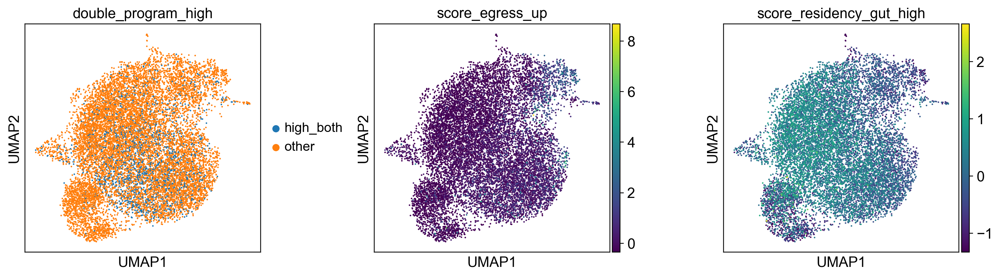

In [11]:
sc.pl.umap(
    expr_adata,
    color=["double_program_high", "score_egress_up", "score_residency_gut_high"],
    ncols=3,
    wspace=0.35,
    show=False,
)
fig = plt.gcf()
state_umap_file = output_dir / "08_sc_double_program_high_umap.png"
fig.savefig(state_umap_file, bbox_inches="tight")
print("Saved:", state_umap_file)


## Klf2 and Cd69 Co-Expression

Use this section to distinguish same-cell co-expression from separate subclusters. The first pass uses detection (`log1p normalized expression > 0`) and also labels cells high for both genes using the 75th percentile of each gene across all cells.


In [12]:
klf2_cd69 = sc.get.obs_df(expr_adata, keys=["Klf2", "Cd69"], use_raw=False)
klf2_cd69["condition"] = expr_adata.obs["condition"].values
klf2_cd69["leiden_0_5"] = expr_adata.obs["leiden_0_5"].astype(str).values

klf2_cd69["Klf2_detected"] = klf2_cd69["Klf2"].gt(0)
klf2_cd69["Cd69_detected"] = klf2_cd69["Cd69"].gt(0)
klf2_cd69["both_detected"] = klf2_cd69["Klf2_detected"] & klf2_cd69["Cd69_detected"]

klf2_high_cutoff = klf2_cd69["Klf2"].quantile(0.75)
cd69_high_cutoff = klf2_cd69["Cd69"].quantile(0.75)

klf2_cd69["Klf2_high"] = klf2_cd69["Klf2"].gt(klf2_high_cutoff)
klf2_cd69["Cd69_high"] = klf2_cd69["Cd69"].gt(cd69_high_cutoff)
klf2_cd69["both_high"] = klf2_cd69["Klf2_high"] & klf2_cd69["Cd69_high"]

expr_adata.obs["Klf2_Cd69_detection_state"] = np.select(
    [
        klf2_cd69["both_detected"],
        klf2_cd69["Klf2_detected"] & ~klf2_cd69["Cd69_detected"],
        ~klf2_cd69["Klf2_detected"] & klf2_cd69["Cd69_detected"],
    ],
    ["Klf2+ Cd69+", "Klf2+ only", "Cd69+ only"],
    default="neither",
)
expr_adata.obs["Klf2_Cd69_high_state"] = np.where(klf2_cd69["both_high"], "Klf2-high Cd69-high", "other")

print("Klf2 high cutoff:", klf2_high_cutoff)
print("Cd69 high cutoff:", cd69_high_cutoff)
klf2_cd69.head()


Klf2 high cutoff: 1.03689906001091
Cd69 high cutoff: 2.54970121383667


,Klf2,Cd69,condition,leiden_0_5,Klf2_detected,Cd69_detected,both_detected,Klf2_high,Cd69_high,both_high
AAACCCAAGTCAAGCG-1,1.393671,2.148739,LPL_memory,5,True,True,True,True,False,False
AAACCCACAATAAGGT-1,1.821681,3.078646,rechallenge,0,True,True,True,True,True,True
AAACCCACAGCCCACA-1,0.000000,2.589519,IEL_memory,6,False,True,False,False,True,False
AAACCCACATACTTTC-1,0.600769,2.308439,IEL_memory,2,True,True,True,False,False,False
AAACCCACATAGTCGT-1,0.572626,2.702200,IEL_memory,2,True,True,True,False,True,False


In [13]:
klf2_cd69_condition = (
    klf2_cd69.groupby("condition", observed=True)
    .agg(
        n_cells=("Klf2", "size"),
        mean_Klf2=("Klf2", "mean"),
        mean_Cd69=("Cd69", "mean"),
        pct_Klf2_detected=("Klf2_detected", "mean"),
        pct_Cd69_detected=("Cd69_detected", "mean"),
        pct_both_detected=("both_detected", "mean"),
        pct_both_high=("both_high", "mean"),
    )
    .reset_index()
)
for col in ["pct_Klf2_detected", "pct_Cd69_detected", "pct_both_detected", "pct_both_high"]:
    klf2_cd69_condition[col] *= 100

klf2_cd69_cluster = (
    klf2_cd69.groupby(["condition", "leiden_0_5"], observed=True)
    .agg(
        n_cells=("Klf2", "size"),
        mean_Klf2=("Klf2", "mean"),
        mean_Cd69=("Cd69", "mean"),
        pct_Klf2_detected=("Klf2_detected", "mean"),
        pct_Cd69_detected=("Cd69_detected", "mean"),
        pct_both_detected=("both_detected", "mean"),
        pct_both_high=("both_high", "mean"),
    )
    .reset_index()
)
for col in ["pct_Klf2_detected", "pct_Cd69_detected", "pct_both_detected", "pct_both_high"]:
    klf2_cd69_cluster[col] *= 100

klf2_cd69_condition_file = output_dir / "08_sc_Klf2_Cd69_coexpression_by_condition.tsv"
klf2_cd69_cluster_file = output_dir / "08_sc_Klf2_Cd69_coexpression_by_condition_cluster.tsv"
klf2_cd69_condition.to_csv(klf2_cd69_condition_file, sep="	", index=False)
klf2_cd69_cluster.to_csv(klf2_cd69_cluster_file, sep="	", index=False)

print("Saved:", klf2_cd69_condition_file)
print("Saved:", klf2_cd69_cluster_file)
klf2_cd69_condition


Saved: /mnt/sata4/Dhruv_2025/Projects_31926/RNA_Seq/Kallies_Sci_Immuno_2025/results/08_sc_dp_like_marker_dynamics/08_sc_Klf2_Cd69_coexpression_by_condition.tsv
Saved: /mnt/sata4/Dhruv_2025/Projects_31926/RNA_Seq/Kallies_Sci_Immuno_2025/results/08_sc_dp_like_marker_dynamics/08_sc_Klf2_Cd69_coexpression_by_condition_cluster.tsv


,condition,n_cells,mean_Klf2,mean_Cd69,pct_Klf2_detected,pct_Cd69_detected,pct_both_detected,pct_both_high
0,IEL_memory,5023,0.473608,1.825729,29.623731,85.068684,26.936094,5.713717
1,LPL_memory,4249,0.452587,1.597911,28.383149,82.631207,24.711697,3.647917
2,rechallenge,3934,0.888883,1.984968,46.644637,84.926284,42.425013,14.667006


In [14]:
klf2_cd69_corr = []
for condition, sub in klf2_cd69.groupby("condition", observed=True):
    klf2_cd69_corr.append(
        {
            "condition": condition,
            "pearson": sub[["Klf2", "Cd69"]].corr(method="pearson").iloc[0, 1],
            "spearman": sub[["Klf2", "Cd69"]].corr(method="spearman").iloc[0, 1],
            "n_cells": len(sub),
        }
    )
klf2_cd69_corr = pd.DataFrame(klf2_cd69_corr)

corr_file = output_dir / "08_sc_Klf2_Cd69_correlation_by_condition.tsv"
klf2_cd69_corr.to_csv(corr_file, sep="	", index=False)
print("Saved:", corr_file)
klf2_cd69_corr


Saved: /mnt/sata4/Dhruv_2025/Projects_31926/RNA_Seq/Kallies_Sci_Immuno_2025/results/08_sc_dp_like_marker_dynamics/08_sc_Klf2_Cd69_correlation_by_condition.tsv


,condition,pearson,spearman,n_cells
0,IEL_memory,0.071616,0.073367,5023
1,LPL_memory,0.037649,0.058530,4249
2,rechallenge,0.120134,0.112550,3934


Saved: /mnt/sata4/Dhruv_2025/Projects_31926/RNA_Seq/Kallies_Sci_Immuno_2025/results/08_sc_dp_like_marker_dynamics/08_sc_Klf2_Cd69_coexpression_umap.png


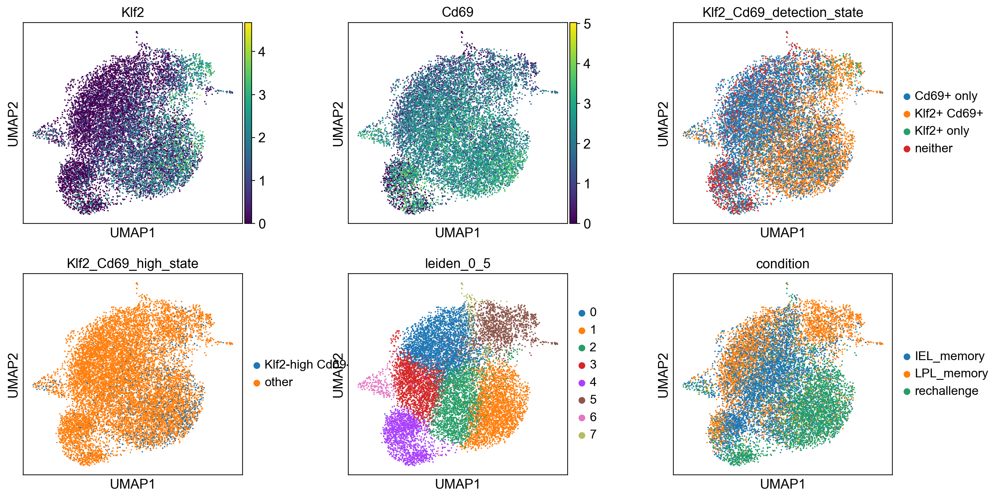

In [15]:
sc.pl.umap(
    expr_adata,
    color=["Klf2", "Cd69", "Klf2_Cd69_detection_state", "Klf2_Cd69_high_state", "leiden_0_5", "condition"],
    use_raw=False,
    ncols=3,
    wspace=0.35,
    show=False,
)
fig = plt.gcf()
klf2_cd69_umap_file = output_dir / "08_sc_Klf2_Cd69_coexpression_umap.png"
fig.savefig(klf2_cd69_umap_file, bbox_inches="tight")
print("Saved:", klf2_cd69_umap_file)


Saved: /mnt/sata4/Dhruv_2025/Projects_31926/RNA_Seq/Kallies_Sci_Immuno_2025/results/08_sc_dp_like_marker_dynamics/08_sc_Klf2_Cd69_expression_hexbin_by_condition.png


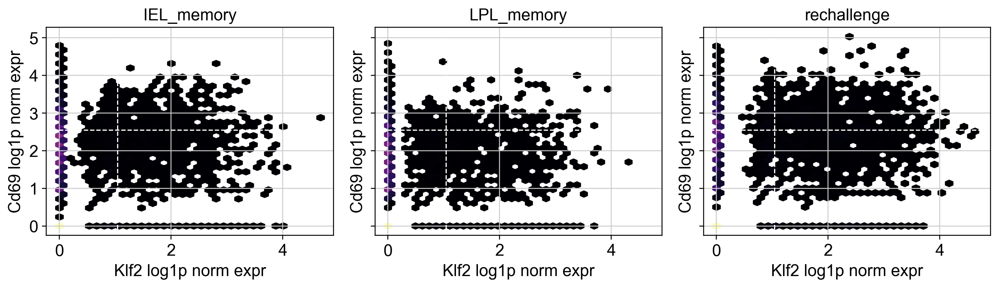

In [16]:
fig, axes = plt.subplots(1, 3, figsize=(12, 3.6), sharex=True, sharey=True)

for ax, condition in zip(axes, condition_order):
    sub = klf2_cd69[klf2_cd69["condition"].astype(str).eq(condition)]
    ax.hexbin(sub["Klf2"], sub["Cd69"], gridsize=35, cmap="magma", mincnt=1)
    ax.axvline(klf2_high_cutoff, color="white", linestyle="--", linewidth=1)
    ax.axhline(cd69_high_cutoff, color="white", linestyle="--", linewidth=1)
    ax.set_title(condition)
    ax.set_xlabel("Klf2 log1p norm expr")
    ax.set_ylabel("Cd69 log1p norm expr")

fig.tight_layout()
scatter_file = output_dir / "08_sc_Klf2_Cd69_expression_hexbin_by_condition.png"
fig.savefig(scatter_file, bbox_inches="tight")
print("Saved:", scatter_file)


Saved: /mnt/sata4/Dhruv_2025/Projects_31926/RNA_Seq/Kallies_Sci_Immuno_2025/results/08_sc_dp_like_marker_dynamics/08_sc_Klf2_Cd69_both_detected_by_cluster_heatmap.png


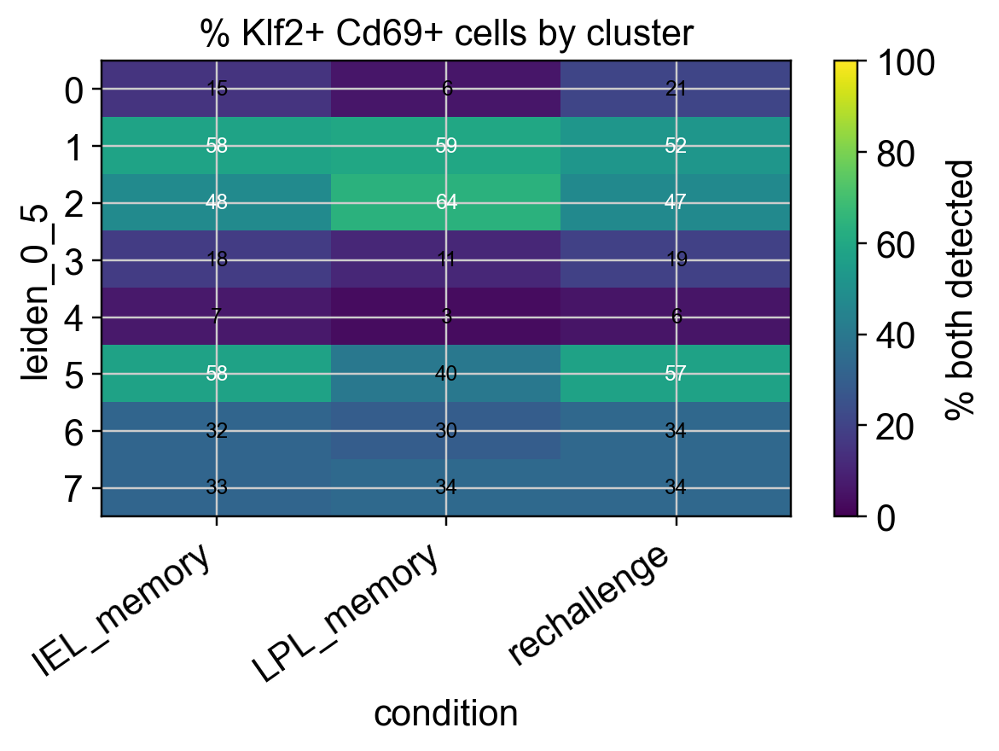

In [17]:
cluster_pivot = (
    klf2_cd69_cluster.pivot_table(
        index="leiden_0_5",
        columns="condition",
        values="pct_both_detected",
        observed=True,
    )
    .sort_index(key=lambda idx: idx.astype(int))
)

fig, ax = plt.subplots(figsize=(5.6, 4.2))
im = ax.imshow(cluster_pivot.values, aspect="auto", cmap="viridis", vmin=0, vmax=100)
ax.set_xticks(range(cluster_pivot.shape[1]))
ax.set_xticklabels(cluster_pivot.columns, rotation=35, ha="right")
ax.set_yticks(range(cluster_pivot.shape[0]))
ax.set_yticklabels(cluster_pivot.index)
ax.set_xlabel("condition")
ax.set_ylabel("leiden_0_5")
ax.set_title("% Klf2+ Cd69+ cells by cluster")

for i in range(cluster_pivot.shape[0]):
    for j in range(cluster_pivot.shape[1]):
        value = cluster_pivot.iloc[i, j]
        if pd.notna(value):
            ax.text(j, i, f"{value:.0f}", ha="center", va="center", color="white" if value > 45 else "black", fontsize=8)

cbar = fig.colorbar(im, ax=ax)
cbar.set_label("% both detected")
fig.tight_layout()
cluster_heatmap_file = output_dir / "08_sc_Klf2_Cd69_both_detected_by_cluster_heatmap.png"
fig.savefig(cluster_heatmap_file, bbox_inches="tight")
print("Saved:", cluster_heatmap_file)
